In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('..')
import pandas as pd
import numpy as np
import hydroeval
from src import load_data, evaluate
import netCDF4 as nc
import pickle
from matplotlib import pyplot as plt
from matplotlib import dates
import datetime as dt

In [8]:
vic_predictions = pd.read_csv('../data/GRIP-E_Hydrographs_VIC-GRU_test2013+2014_allStations.csv').drop(['time', 'hour', 'precip [mm/day]'], axis=1)
subid2gauge = pd.read_csv('../data/VIC-GRU_subid2gauge.csv')[['SubId', 'ID']].set_index('SubId')

vic_predictions = vic_predictions.rename(lambda c: subid2gauge.loc[int(c[3:6])].values[0] if c not in ['date', 'hour', 'precip [mm/day]'] else c, axis=1)
vic_predictions = vic_predictions.set_index('date').transpose().unstack().reset_index().rename({'level_0': 'date', 'level_1': 'station', 0: 'vic_prediction'}, axis=1)
vic_predictions['date'] = pd.to_datetime(vic_predictions['date']) - dt.timedelta(days=1)

In [3]:
xgb_file = '20190706-082538'
xgb_predictions = pickle.load(open('../pickle/results/XGBoost_VIC_aggregateForcings_{}.pkl'.format(xgb_file),'rb'))
xgb_predictions = xgb_predictions.drop(['actual'], axis=1).rename({'prediction': 'xgb_prediction'}, axis=1)

In [4]:
lin_file = '20190708-091424'
lin_predictions = pickle.load(open('../pickle/results/LinReg_VIC_aggregateForcings_{}.pkl'.format(lin_file),'rb'))
lin_predictions = lin_predictions.drop(['actual'], axis=1).rename({'prediction': 'lin_prediction'}, axis=1)

In [5]:
ground_truth = load_data.load_discharge_gr4j_vic()
ground_truth = ground_truth[~pd.isna(ground_truth['runoff'])]

In [10]:
data = pd.merge(ground_truth, vic_predictions, on=['date', 'station'])
data = pd.merge(data, lin_predictions, on=['date', 'station'])
data = pd.merge(data, xgb_predictions, on=['date', 'station'])
data = data[(data['date'] > '2012-12-31') & (data['date'] < '2015-01-01')]

..\src\evaluate.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(17,4))
..\src\evaluate.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(17,4))
..\src\evaluate.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(17,4))
..\src\evaluate.py:44: Ru

XGB outperforms VIC in 40 of the stations by 0.47322196836254626 on average
XGB almost outperforms VIC in 42 of the stations (tol 0.07)
VIC Median NSE (clipped to 0) 0.32827190435178966 / Min -6.301638840616013 / Max 0.5972614332012951
XGB Median NSE (clipped to 0) 0.5222957762280172 / Min -0.20600531332203498 / Max 0.666221324763711
LIN Median NSE (clipped to 0) 0.37990824204466384 / Min -1.6766047081809439 / Max 0.5845953217295347
VIC Median MSE (clipped to 0) 116.95923758291275 / Min 12.921209491749757 / Max 28514.19228840315
XGB Median MSE (clipped to 0) 96.82126751132567 / Min 2.9515256400193297 / Max 31010.79787935949
XGB Median MSE (clipped to 0) 109.11964356213701 / Min 3.773554642212663 / Max 139157.30643437852


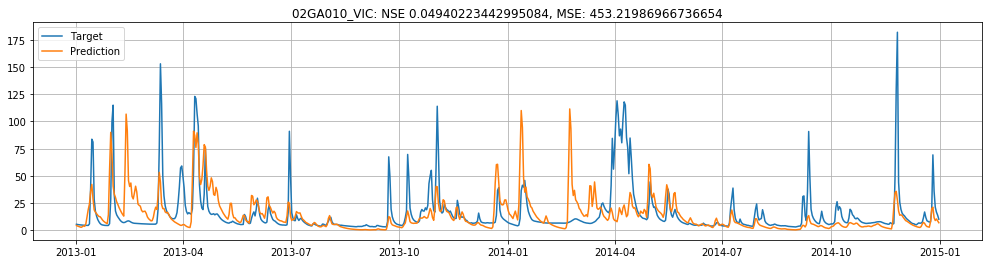

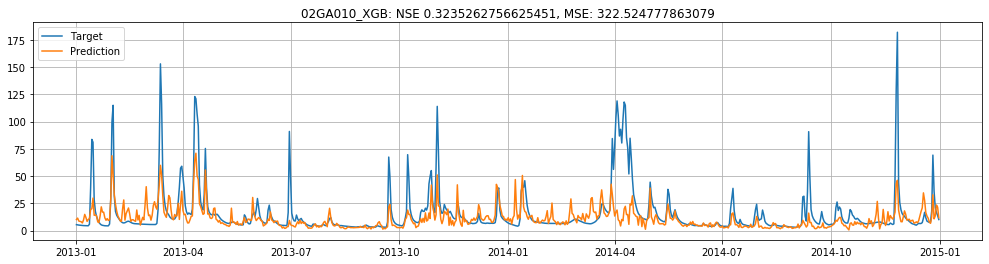

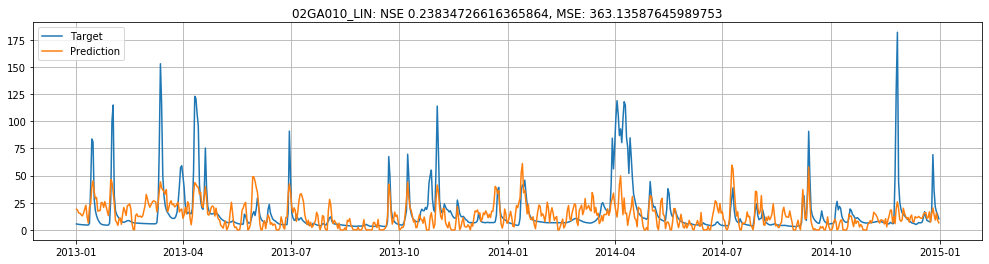

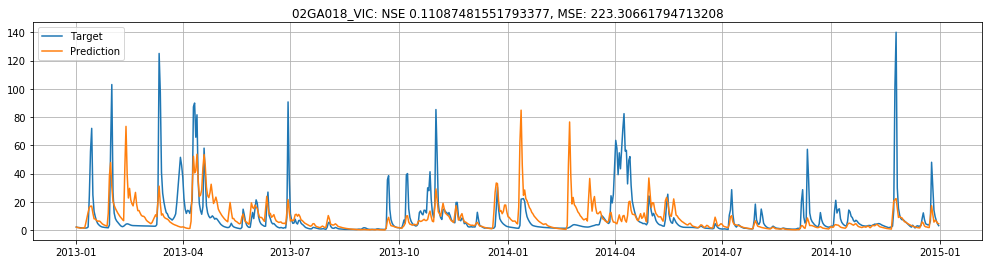

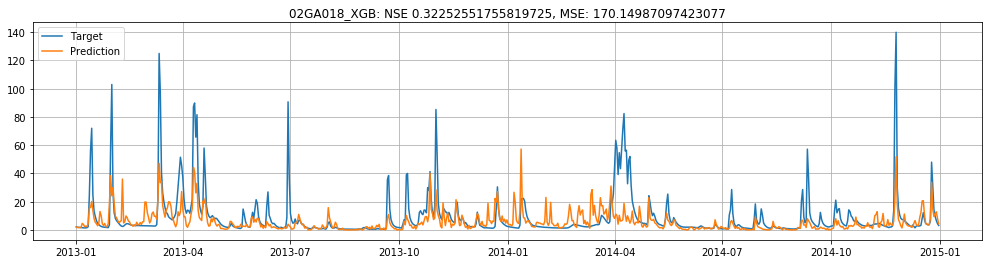

...

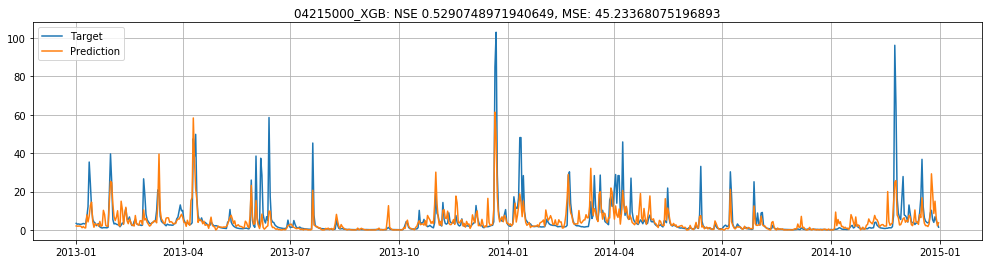

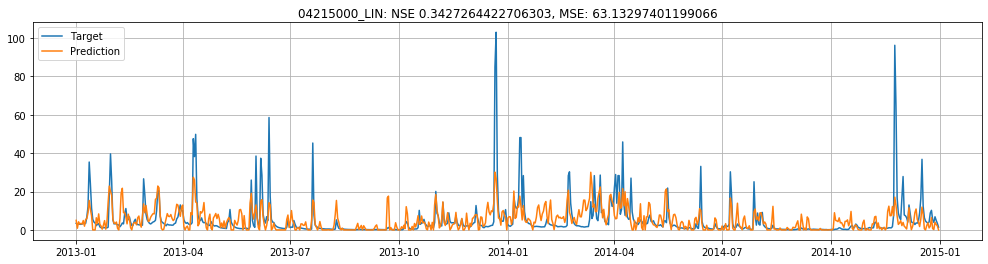

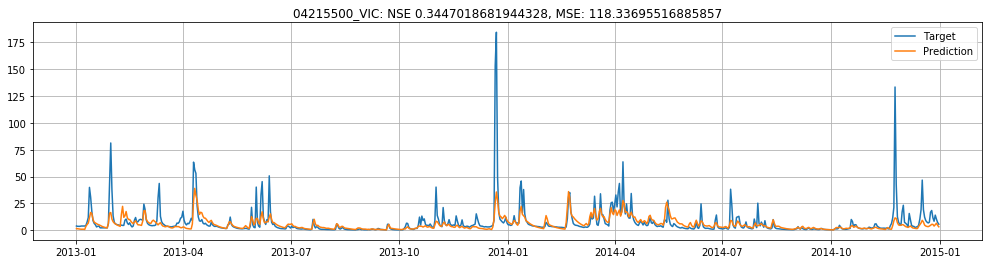

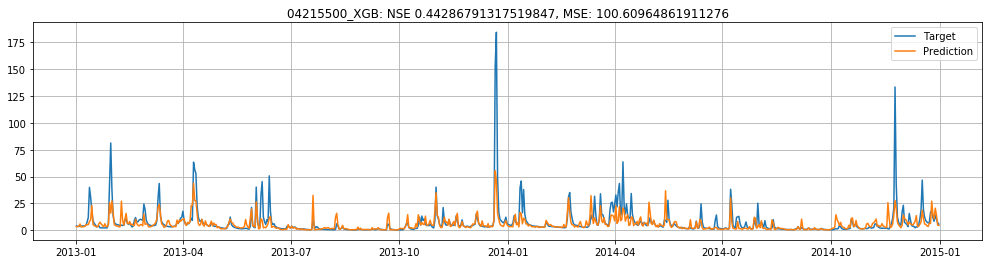

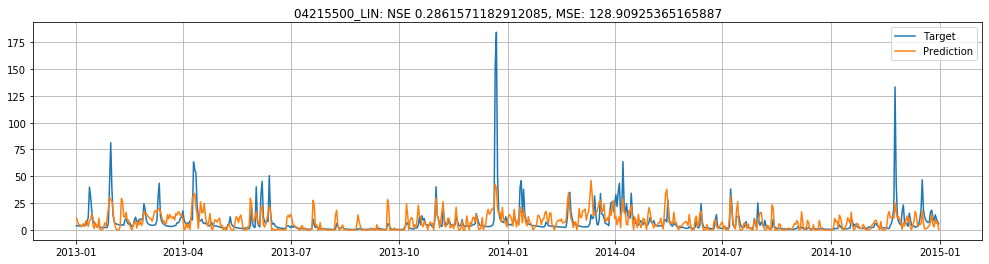

In [11]:
plot_list = []
vic_nse_list, vic_mse_list = [], []
xgb_nse_list, xgb_mse_list = [], []
lin_nse_list, lin_mse_list = [], []
xgb_larger, xgb_almost_larger = 0, 0
xgb_outperf = 0
tol = 0.07
for station in data['station'].unique():
    station_data = data[data['station']==station].set_index('date')
    
    vic_nse, vic_mse = evaluate.evaluate_daily(station+'_VIC', station_data[['vic_prediction']], station_data['runoff'], plot=True)#station in plot_list)
    xgb_nse, xgb_mse = evaluate.evaluate_daily(station+'_XGB', station_data[['xgb_prediction']], station_data['runoff'], plot=True)#station in plot_list)
    lin_nse, lin_mse = evaluate.evaluate_daily(station+'_LIN', station_data[['lin_prediction']], station_data['runoff'], plot=True)#station in plot_list)
    vic_nse_list.append(vic_nse)
    vic_mse_list.append(vic_mse)
    xgb_nse_list.append(xgb_nse)
    xgb_mse_list.append(xgb_mse)
    lin_nse_list.append(lin_nse)
    lin_mse_list.append(lin_mse)
    if xgb_nse > vic_nse:
        xgb_larger += 1
        xgb_outperf += (xgb_nse - vic_nse)
    if xgb_nse > vic_nse - tol:
        xgb_almost_larger += 1

print('XGB outperforms VIC in {} of the stations by {} on average'.format(xgb_larger, xgb_outperf/xgb_larger))
print('XGB almost outperforms VIC in {} of the stations (tol {})'.format(xgb_almost_larger, tol))
print('VIC Median NSE (clipped to 0)', np.median(vic_nse_list), '/ Min', np.min(vic_nse_list), '/ Max', np.max(vic_nse_list))
print('XGB Median NSE (clipped to 0)', np.median(xgb_nse_list), '/ Min', np.min(xgb_nse_list), '/ Max', np.max(xgb_nse_list))
print('LIN Median NSE (clipped to 0)', np.median(lin_nse_list), '/ Min', np.min(lin_nse_list), '/ Max', np.max(lin_nse_list))

print('VIC Median MSE (clipped to 0)', np.median(vic_mse_list), '/ Min', np.min(vic_mse_list), '/ Max', np.max(vic_mse_list))
print('XGB Median MSE (clipped to 0)', np.median(xgb_mse_list), '/ Min', np.min(xgb_mse_list), '/ Max', np.max(xgb_mse_list))
print('XGB Median MSE (clipped to 0)', np.median(lin_mse_list), '/ Min', np.min(lin_mse_list), '/ Max', np.max(lin_mse_list))

04207200 VIC: 0.44282894362752756 XGB: 0.5684126400005045 Ridge: 0.5667428918913506
04177000 VIC: 0.33416001234153936 XGB: 0.1314257288053211 Ridge: 0.36844349791893494
04166500 VIC: -1.950562477912738 XGB: 0.63735570226305 Ridge: 0.5168516736587957


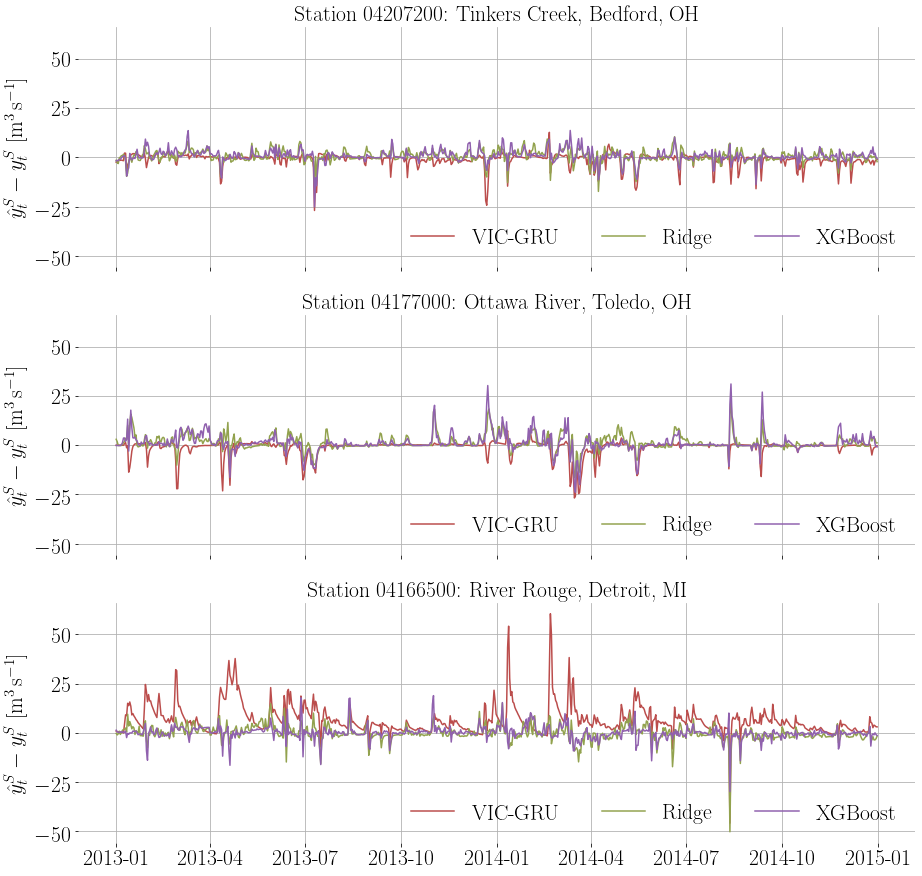

In [66]:
stations = ['04207200', '04177000', '04166500']#
station_names = ['Tinkers Creek, Bedford, OH', 'Ottawa River, Toledo, OH', 'River Rouge, Detroit, MI']

f, ax = plt.subplots(nrows=len(stations), ncols=1, figsize=(15,5*len(stations)), sharex=True, sharey=True)
plt.rc('text', usetex=True)
plt.rc('text.latex', preamble=r'\usepackage{siunitx}')
plt.rcParams.update({'axes.titlesize': 'x-large',
                     'axes.labelsize': 'x-large',
                     'legend.fontsize': 'x-large',
                     'xtick.labelsize':'x-large',
                     'ytick.labelsize':'x-large'})
i = 0
for station in stations:
    station_data = data[data['station']==station].set_index('date')
    station_data = station_data.loc['2013':'2014']

    vic_nse, _ = evaluate.evaluate_daily(station, station_data[['vic_prediction']], station_data['runoff'], plot=False)
    xgb_nse, _ = evaluate.evaluate_daily(station, station_data[['xgb_prediction']], station_data['runoff'], plot=False)
    lin_nse, _ = evaluate.evaluate_daily(station, station_data[['lin_prediction']], station_data['runoff'], plot=False)
    print(station, 'VIC:', vic_nse, 'XGB:', xgb_nse, 'Ridge:', lin_nse)

    
    #ax[i].plot(range(len(station_data)), station_data['runoff'], label='Target', color='#92a24e')#b9495e')
    ax[i].plot(range(len(station_data)), (station_data['vic_prediction'].clip(0) - station_data['runoff']), label='VIC-GRU'.format(vic_nse), color='#bb4d4c')#8960b3')
    ax[i].plot(range(len(station_data)), (station_data['lin_prediction'].clip(0) - station_data['runoff']), label='Ridge'.format(lin_nse), color='#92a24e')#b78b39')
    ax[i].plot(range(len(station_data)), (station_data['xgb_prediction'].clip(0) - station_data['runoff']), label='XGBoost'.format(xgb_nse), color='#9061ae')#61ad65')
    ax[i].grid()
    l = ax[i].legend(ncol=3, loc='lower right', frameon=False, columnspacing=2)

    dates = pd.Series(pd.date_range('2013-01-01', '2015-01-01', freq='D'))
    xticks = dates[dates.dt.day==1][::3]
    ax[i].set_xticks(xticks.index.values)
    ax[i].set_xticklabels(xticks.dt.strftime('%Y-%m').values, rotation=0)
    ax[i].set_ylabel('$\hat{y}_t^S - y_t^S$ [\si{\cubic\metre\per\second}]')
    
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].spines['left'].set_visible(False)
    
    i += 1
#plt.tight_layout()

for i in range(len(stations)):
    extent = ax[i].get_tightbbox(f.canvas.get_renderer()).transformed(f.dpi_scale_trans.inverted())
    ax[i].set_title('Station {}: {}'.format(stations[i], station_names[i]))
    plt.savefig('../figures/{}_vic-gru_xgboost{}_linreg{}_2014.pdf'.format(stations[i], xgb_file, lin_file), bbox_inches=extent.expanded(1.01,1.2))
#tikzplotlib.save('../figures/{}_vic-gru_xgboost{}_linreg{}_2014.tex'.format('-'.join(stations), xgb_file, lin_file), figureheight='\\figureheight', figurewidth='\\figurewidth')

In [13]:
print(pd.DataFrame([vic_nse_list, lin_nse_list, xgb_nse_list], index=['VIC-GRU', 'Ridge', 'XGBoost']).transpose().describe())

         VIC-GRU      Ridge    XGBoost
count  46.000000  46.000000  46.000000
mean    0.075653   0.293737   0.461663
std     1.059350   0.382780   0.161742
min    -6.301639  -1.676605  -0.206005
25%     0.184355   0.298495   0.411604
50%     0.328272   0.379908   0.522296
75%     0.375708   0.468738   0.560518
max     0.597261   0.584595   0.666221


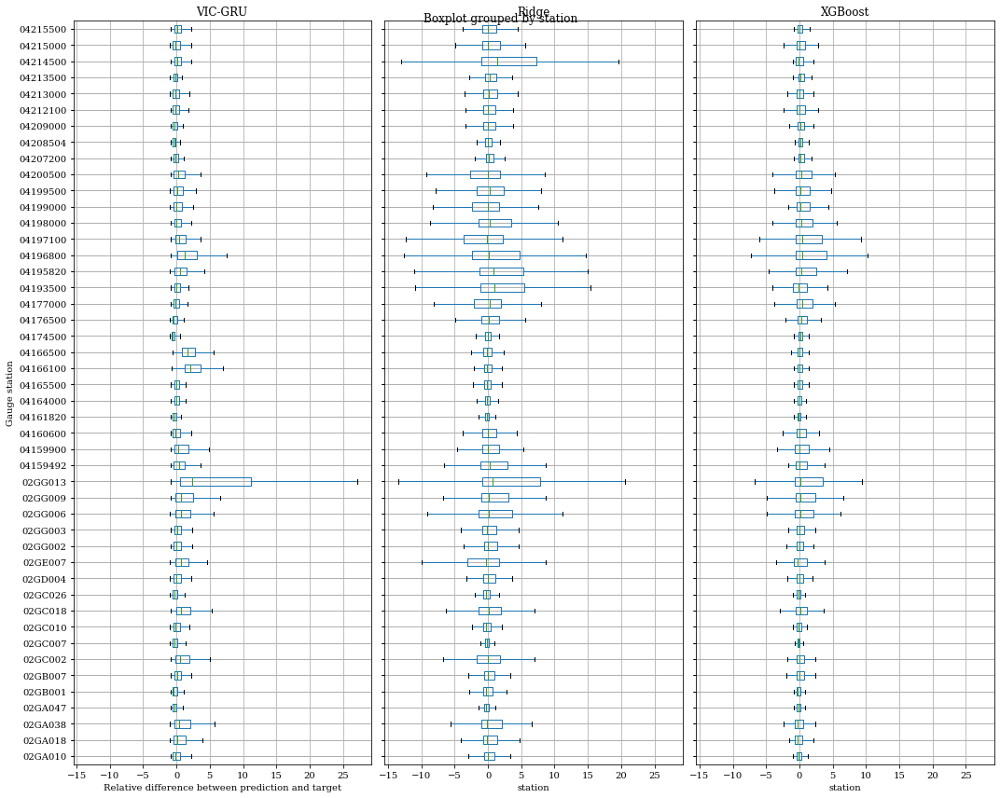

In [20]:
a = data.copy()
a['VIC-GRU'] = (a['vic_prediction'] - a['runoff']) / a['runoff']
a['Ridge'] = (a['lin_prediction'] - a['runoff']) / a['runoff']
a['XGBoost'] = (a['xgb_prediction'] - a['runoff']) / a['runoff']
f1, f2, f3 = a.boxplot(by='station', column=['VIC-GRU', 'Ridge', 'XGBoost'], showfliers=False, vert=False, figsize=(15,12), layout=(1,3))
f1.set_xlabel('Relative difference between prediction and target')
f1.set_ylabel('Gauge station')  
plt.tight_layout()

In [14]:
0.375708-0.184355

0.191353

In [18]:
(0.522296 - 0.379908) / 0.379908   

0.37479600324289025

In [16]:
(0.522296 - 0.328272) / 0.255857

0.7583298483137064

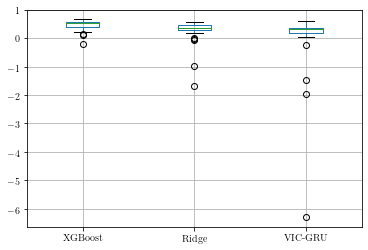

In [17]:
pd.DataFrame([xgb_nse_list, lin_nse_list, vic_nse_list], index=['XGBoost', 'Ridge', 'VIC-GRU']).transpose().boxplot()

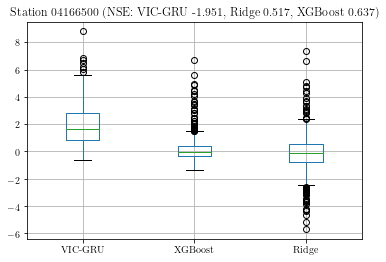

In [18]:
station = '04166500'

f = plt.figure()
station_data = data[data['station']==station].set_index('date')

vic_nse, _ = evaluate.evaluate_daily(station, station_data[['vic_prediction']], station_data['runoff'], plot=False)
xgb_nse, _ = evaluate.evaluate_daily(station, station_data[['xgb_prediction']], station_data['runoff'], plot=False)
lin_nse, _ = evaluate.evaluate_daily(station, station_data[['lin_prediction']], station_data['runoff'], plot=False)

plt.title('Station {} (NSE: VIC-GRU {:.3f}, Ridge {:.3f}, XGBoost {:.3f})'.format(station, vic_nse, lin_nse, xgb_nse))
f = pd.DataFrame([(station_data['vic_prediction'] - station_data['runoff'])/station_data['runoff'], (station_data['xgb_prediction'] - station_data['runoff'])/station_data['runoff'], (station_data['lin_prediction'] - station_data['runoff'])/station_data['runoff']], index=['VIC-GRU', 'XGBoost', 'Ridge']).transpose().boxplot()

In [16]:
xgb_nse_list[37], vic_nse_list[37], xgb_nse_list[7], vic_nse_list[7]

(0.5975178232866429,
 -7.175453461197932,
 -0.20600531332203498,
 0.22992352457666565)

In [17]:
data['station'].unique()[12]

'04177000'

04177000 VIC: 0.2551917445320233 XGB: 0.09698319798200306
04166500 VIC: -1.7213896743854797 XGB: 0.6446791775375731


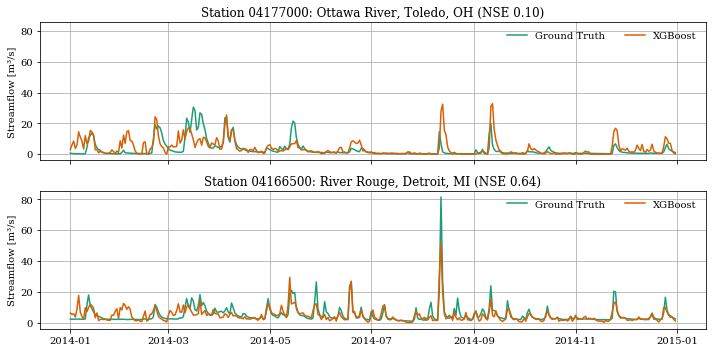

In [19]:
stations = ['04177000', '04166500']
station_names = ['Ottawa River, Toledo, OH', 'River Rouge, Detroit, MI']
plt.rc('text', usetex=False)
f, ax = plt.subplots(nrows=2, ncols=1, figsize=(10,5), sharex=True, sharey=True)
i = 0
for station in stations:
    station_data = data[data['station']==station].set_index('date')
    station_data = station_data[(station_data.index >= '2014-01-01') & (station_data.index <= '2014-12-31')]

    vic_nse, _ = evaluate.evaluate_daily(station, station_data[['vic_prediction']], station_data['runoff'], plot=False)
    xgb_nse, _ = evaluate.evaluate_daily(station, station_data[['xgb_prediction']], station_data['runoff'], plot=False)
    print(station, 'VIC:', vic_nse, 'XGB:', xgb_nse)

    ax[i].set_title('Station {}: {} (NSE {:.2f})'.format(station, station_names[i], xgb_nse))
    ax[i].plot(station_data.index, station_data['runoff'].clip(0), label='Ground Truth', color='#1b9e77')#8960b3')
    ax[i].plot(station_data.index, station_data['xgb_prediction'].clip(0), label='XGBoost', color='#d95f02')#61ad65')
    ax[i].grid()
    l = ax[i].legend(ncol=3, loc='upper right', frameon=False, columnspacing=2)

    dates = pd.Series(pd.date_range('2014-01-01', '2015-01-01', freq='D'))
    ax[i].set_ylabel('Streamflow [m³/s]')
    i += 1
plt.tight_layout()
plt.savefig('../figures/{}_xgboost{}_2014.png'.format('-'.join(stations), xgb_file), bbox_inches='tight', dpi=300)